In [ ]:
!pip install pandas


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!apt install -y libsndfile1 ffmpeg
!pip install musdb
!pip install museval
!pip install -q scikit_posthocs
!pip install librosa

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libsndfile1 is already the newest version (1.0.28-7ubuntu0.1).
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 27 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.5/963.5 KB 42.8 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.5/135.5 KB 12.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy, scipy, matplotlib.pyplot as plt, sklearn, librosa, IPython.display, urllib
from IPython.display import Audio, display
import urllib.request
import numpy as np
import scipy.stats
import seaborn as sns
import pandas as pd
import scikit_posthocs as sp
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib.transforms import BlendedGenericTransform
import scikit_posthocs as sp
from urllib.request import urlopen
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [ ]:
pip install mir_eval

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.7/90.7 KB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for mir_eval: filename=mir_eval-0.7-py3-none-any.whl size=100720 sha256=50148b34922bc0b67a4872210399d7d352c4c59008f8931d1147704eafcd6a08
  Stored in directory: /root/.cache/pip/wheels/20/53/83/1d50d15a666140d53eda589db005f7cb53b739c7e54711f51f
Successfully built mir_eval


In [ ]:
import musdb, mir_eval

In [ ]:
mus = musdb.DB(download=True)



Done!


In [ ]:
urllib.request.urlretrieve(
    'https://raw.githubusercontent.com/faroit/stempeg/master/stempeg/data/The%20Easton%20Ellises%20-%20Falcon%2069.stem.mp4',
    'track.stem.mp4')

('track.stem.mp4', <http.client.HTTPMessage at 0x7ff9c6cc8f40>)

In [ ]:
import stempeg
S, rate = stempeg.read_stems('track.stem.mp4')
print(S.shape)


(5, 268288, 2)


In [ ]:
print("Mixture")
display(Audio(S[0].T, rate=rate))
print("Vocals")
display(Audio(S[4].T, rate=rate))
print("Drums")
display(Audio(S[1].T, rate=rate))

Mixture


Vocals


Drums


In [ ]:
track = mus[26]
print(track.name)
Audio(track.audio.T, rate=track.rate)

Drumtracks - Ghost Bitch


In [ ]:
Audio(librosa.to_mono(track.audio.T))

NameError: ignored

In [ ]:
track.targets

OrderedDict([('vocals', vocals),
             ('drums', drums),
             ('bass', bass),
             ('other', other),
             ('accompaniment', bass+drums+other),
             ('linear_mixture', vocals+bass+drums+other)])

In [ ]:
vocals = track.targets['vocals']
Audio(vocals.audio.T, rate=track.rate)

In [ ]:
import librosa
import librosa.display

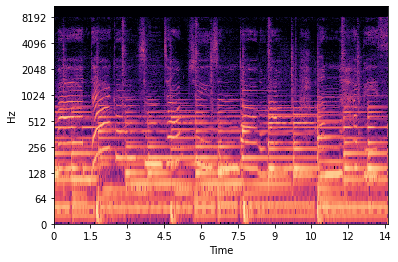

In [ ]:
X = librosa.stft(librosa.to_mono(track.audio.T))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(X), ref=np.max), y_axis='log', x_axis='time')

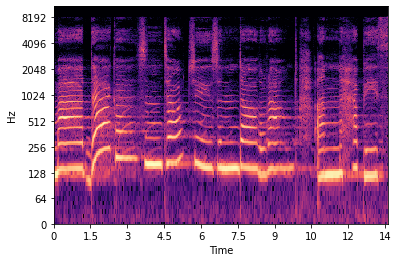

In [ ]:
S_vocals = np.abs(librosa.stft(librosa.to_mono(track.targets['vocals'].audio.T)))
librosa.display.specshow(librosa.amplitude_to_db(S_vocals, ref=np.max), y_axis='log', x_axis='time')


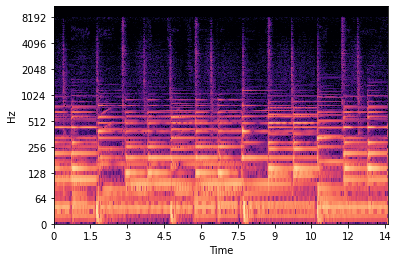

In [ ]:
S_accompaniment = np.abs(librosa.stft(librosa.to_mono(track.targets['accompaniment'].audio.T)))
librosa.display.specshow(librosa.amplitude_to_db(S_accompaniment, ref=np.max), y_axis='log', x_axis='time')


In [ ]:

eps = np.finfo(np.float).eps
model = eps + np.abs(S_vocals) + np.abs(S_accompaniment)

<ipython-input-59-ccde35c0a053>:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps = np.finfo(np.float).eps


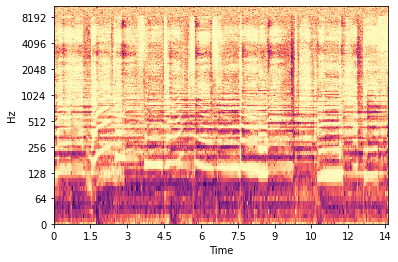

In [ ]:
Mask_vocals = np.divide(np.abs(S_vocals), model)

librosa.display.specshow(librosa.amplitude_to_db(np.abs(Mask_vocals), ref=np.max), y_axis='log', x_axis='time')

In [ ]:
Y_vocals = np.multiply(X, Mask_vocals)

vocals_estimate = librosa.istft(Y_vocals)

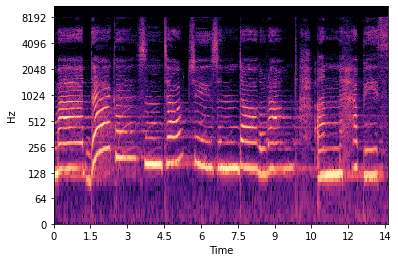

In [ ]:
librosa.display.specshow(librosa.amplitude_to_db(np.abs(Y_vocals), ref=np.max), y_axis='log', x_axis='time')
Audio(vocals_estimate, rate=track.rate)

In [ ]:
Mask_accompaniment = np.divide(np.abs(S_accompaniment), model)
Y_accompaniment = np.multiply(X, Mask_accompaniment)
accompaniment_estimate = librosa.istft(Y_accompaniment)

In [ ]:
Audio(accompaniment_estimate, rate=track.rate)

In [ ]:
from scipy.signal import stft, istft
f, t, X = stft(track.audio.T, nperseg=4096, noverlap=3072)
print(X.shape)
t, audio = istft(X, track.rate, nperseg=4096, noverlap=3072)

(2, 2049, 294)


In [ ]:
import torch

eps = np.finfo(np.float).eps


N = track.audio.shape[0]
X = stft(track.audio.T, nperseg=4096, noverlap=3072)[-1]
(I, F, T) = X.shape

P = {}


for name, source in track.sources.items():

    unmix = torch.hub.load('sigsep/open-unmix-pytorch', model='umx')
    P[name] = unmix(torch.tensor(track.audio.T[None, ...]).float()).detach().numpy()[:, 0, ...].transpose(1, 2, 0)
    P[name] = np.abs(stft(source.audio.T, nperseg=4096, noverlap=3072)[-1])
    model += P[name]



<ipython-input-68-6232fc88723f>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps = np.finfo(np.float).eps
Using cache found in /root/.cache/torch/hub/sigsep_open-unmix-pytorch_master
Using cache found in /root/.cache/torch/hub/sigsep_open-unmix-pytorch_master
Using cache found in /root/.cache/torch/hub/sigsep_open-unmix-pytorch_master
Using cache found in /root/.cache/torch/hub/sigsep_open-unmix-pytorch_master


In [ ]:
# now performs separation
estimates = {}
for name, source in track.sources.items():

    Mask = P[name] / model


    Yj = Mask * X

    # invert to time domain
    target_estimate = istft(Yj, nperseg=4096, noverlap=3072)[1].T

    #
    estimates[name] = target_estimate

In [ ]:
for target, estimate in estimates.items():
  display(Audio(estimate.T, rate=track.rate))

In [ ]:
import museval

track_scores = museval.eval_mus_track(track, estimates)
print(track_scores)

vocals          ==> SDR:  12.095  SIR:  17.591  ISR:  15.049  SAR:  13.048  
drums           ==> SDR:   7.043  SIR:  13.804  ISR:  10.490  SAR:   8.822  
bass            ==> SDR:   7.505  SIR:  11.828  ISR:  11.277  SAR:  10.517  
other           ==> SDR:  12.457  SIR:  15.796  ISR:  16.218  SAR:  15.143  



In [ ]:
track = mus[40]
print(track.name)
vocals = track.targets['vocals']
Audio(vocals.audio.T, rate=track.rate)

James May - Dont Let Go


In [ ]:
x = librosa.to_mono((np.abs(track.targets['vocals'].audio.T)))
fmin = librosa.midi_to_hz(18)
hop_length = 128
C = librosa.feature.chroma_cqt(x, hop_length=hop_length)

[Text(0, 0.5, 'Harmonic')]

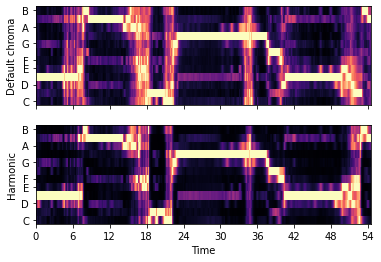

<Figure size 1080x720 with 0 Axes>

In [ ]:
y_harm = librosa.effects.harmonic(y=x, margin=5)
chroma_harm = librosa.feature.chroma_cqt(y=y_harm, sr=22050, hop_length = hop_length)


fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True)
plt.figure(figsize=(15, 10))
librosa.display.specshow(C, y_axis='chroma', x_axis='time', ax=ax[0])
ax[0].set(ylabel='Default chroma')
ax[0].label_outer()

librosa.display.specshow(chroma_harm, y_axis='chroma', x_axis='time', ax=ax[1])
ax[1].set(ylabel='Harmonic')



In [ ]:
Estimate = librosa.istft(C)
Audio(Estimate,rate=4096)